In [18]:
import numpy as np
import scipy as sp  
from scipy.fft import fft, fftfreq, fftshift, ifft, fft2, ifft2
from scipy.signal import freqz, periodogram, welch 
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt
import random 
from PIL import Image
import pywt




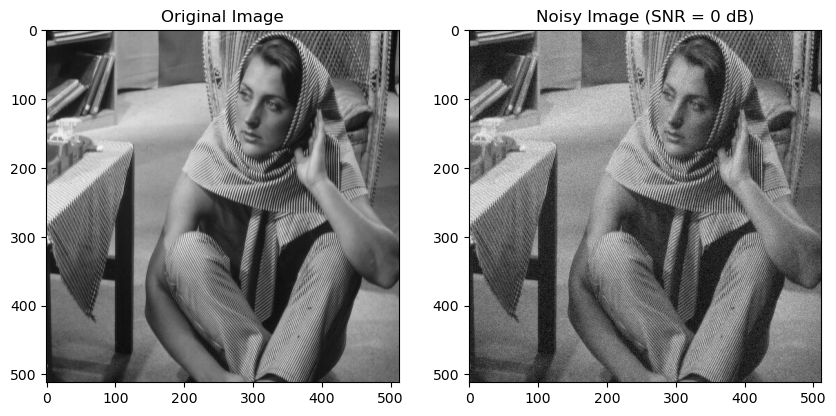

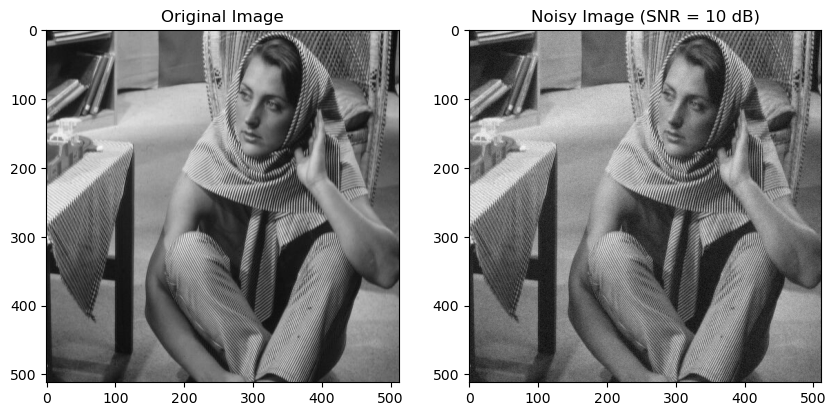

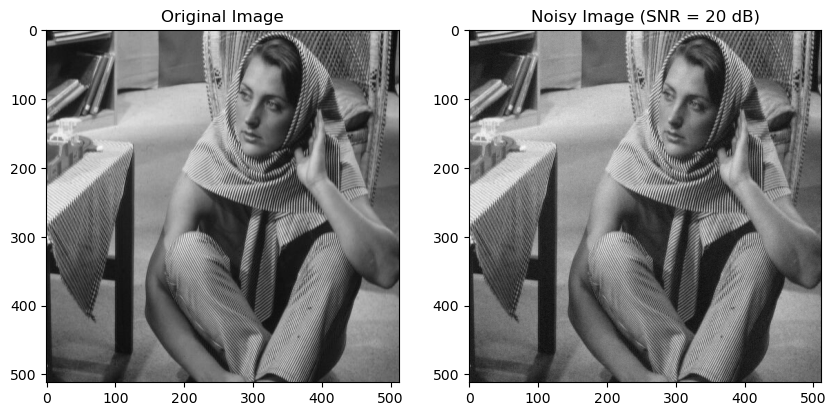

In [19]:
#We simulate a noisy version of the image with various SNR (0 db, 10 dB and 20 dB), using a Gaussian white noise

# Reading the image
img_pil = Image.open('barbara.jpg').convert("L")  # Convert to grayscale
img = np.array(img_pil)  # Convert PIL Image to NumPy array

def generate_noise(img, snr):
    N= img.shape[0]*img.shape[1]
    noise_var = (np.sum(img**2)/N)* np.exp(-snr / 10)
    noise = np.random.normal(0, np.sqrt(noise_var), img.shape)
    return noise

def add_noise(img, snr):
    return img + generate_noise(img, snr)

def plot_noisy_image(img, snr):

    # Plotting the image and the noisy image
    plt.figure(figsize=(10, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')

    plt.subplot(1, 2, 2)
    # Adding noise to the image
    noisy_img = add_noise(img, snr)
    # Cliping the values to be in range [0, 255]
    noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)
    plt.imshow(noisy_img, cmap='gray')
    plt.title('Noisy Image (SNR = ' + str(snr) + ' dB)')
    plt.show()


plot_noisy_image(img, 0)
plot_noisy_image(img, 10)
plot_noisy_image(img, 20)

In [20]:
# function to perform wavelet denoising 
def denoise_wavelet_adaptive(img, wavelet_type, level, threshold_type, noise_std):
    coeffs = pywt.wavedec2(img, wavelet_type, level=level)
    
    thresholded_coeffs = []
    for i, coeff in enumerate(coeffs):
        if i == 0:
            thresholded_coeffs.append(coeff)
        else:
            thresholded_detail = []
            for detail_coefficients in coeff:
                threshold_value = noise_std  # setting threshold based on noise standard deviation
                if threshold_type == 'hard':
                    detail_coefficients = pywt.threshold(detail_coefficients, threshold_value, mode='hard')
                elif threshold_type == 'soft':
                    detail_coefficients = pywt.threshold(detail_coefficients, threshold_value, mode='soft')
                thresholded_detail.append(detail_coefficients)
            thresholded_coeffs.append(tuple(thresholded_detail))
    
    denoised_img = pywt.waverec2(thresholded_coeffs, wavelet_type)
    denoised_img = np.clip(denoised_img, 0, 255).astype(np.uint8)
    
    return denoised_img




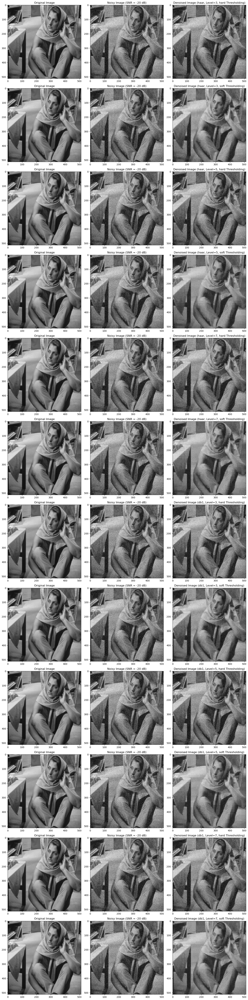

In [21]:
# Update the function to use adaptive thresholding for denoising
def plot_grid_images_adaptive(img, snr, wavelet_types, levels, threshold_types):
    n_wavelets = len(wavelet_types)
    n_levels = len(levels)
    n_thresholds = len(threshold_types)
    
    noise = generate_noise(img, snr)
    noise_std = np.std(noise)
    
    plt.figure(figsize=(15, 5 * n_wavelets * n_levels * n_thresholds))
    
    index = 1
    for wavelet_type in wavelet_types:
        for level in levels:
            for threshold_type in threshold_types:
                plt.subplot(n_wavelets * n_levels * n_thresholds, 3, index)
                plt.imshow(img, cmap='gray')
                plt.title('Original Image')
                
                noisy_img = add_noise(img, snr)
                noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)
                
                plt.subplot(n_wavelets * n_levels * n_thresholds, 3, index + 1)
                plt.imshow(noisy_img, cmap='gray')
                plt.title(f'Noisy Image (SNR = {snr} dB)')
                
                denoised_img = denoise_wavelet_adaptive(noisy_img, wavelet_type, level, threshold_type, noise_std)
                
                plt.subplot(n_wavelets * n_levels * n_thresholds, 3, index + 2)
                plt.imshow(denoised_img, cmap='gray')
                plt.title(f'Denoised Image ({wavelet_type}, Level={level}, {threshold_type} Thresholding)')
                
                index += 3
    
    plt.tight_layout()
    plt.show()



snr = -20  # signal to Noise Ratio in dB

# list of wavelet types, levels, and threshold types to explore
new_wavelet_types = ['haar', 'db1']
new_levels = [3, 5, 7]
threshold_types = ['hard', 'soft']

plot_grid_images_adaptive(img, snr, new_wavelet_types, new_levels, threshold_types)

In [22]:
def calculate_snr(original, denoised):
    signal_power = np.mean(original ** 2)
    noise_power = np.mean((original - denoised) ** 2)
    if noise_power == 0:
        return float('inf')
    snr_value = 10 * np.log10(signal_power / noise_power)
    return snr_value


# Re-defining the function to generate a table of SNR values for different combinations
# and sort the table by SNR value due to the state reset
def generate_sorted_snr_table(img, snr, wavelet_types, levels, threshold_types):
    table_data = []
    
    noise = generate_noise(img, snr)
    noise_std = np.std(noise)
    
    noisy_img = add_noise(img, snr)
    noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)
    
    for wavelet_type in wavelet_types:
        for level in levels:
            for threshold_type in threshold_types:
                denoised_img = denoise_wavelet_adaptive(noisy_img, wavelet_type, level, threshold_type, noise_std)
                snr_value = calculate_snr(img, denoised_img)
                row = [wavelet_type, level, threshold_type, round(snr_value, 2)]
                table_data.append(row)
                
    # Sort table data by SNR value in descending order
    table_data.sort(key=lambda x: x[3], reverse=True)
    
    # Print headers
    headers = ['Wavelet Type', 'Number of Levels', 'Threshold Type', 'SNR (dB)']
    print("{:<15} {:<20} {:<15} {:<10}".format(*headers))
    print("="*60)
    
    # Print sorted rows
    for row in table_data:
        print("{:<15} {:<20} {:<15} {:<10}".format(*row))

# Generate and display the SNR table sorted by SNR values

# Re-define parameters
snr = -20  # Signal to Noise Ratio in dB
new_wavelet_types = ['haar', 'db1']
new_levels = [3, 5, 7]
threshold_types = ['hard', 'soft']

# Generate and display the SNR table sorted by SNR values
generate_sorted_snr_table(img, snr, new_wavelet_types, new_levels, threshold_types)


Wavelet Type    Number of Levels     Threshold Type  SNR (dB)  
haar            3                    soft            1.64      
haar            5                    soft            1.64      
db1             3                    soft            1.64      
db1             5                    soft            1.64      
haar            7                    soft            1.63      
db1             7                    soft            1.63      
haar            3                    hard            0.62      
haar            5                    hard            0.62      
haar            7                    hard            0.62      
db1             3                    hard            0.62      
db1             5                    hard            0.62      
db1             7                    hard            0.62      


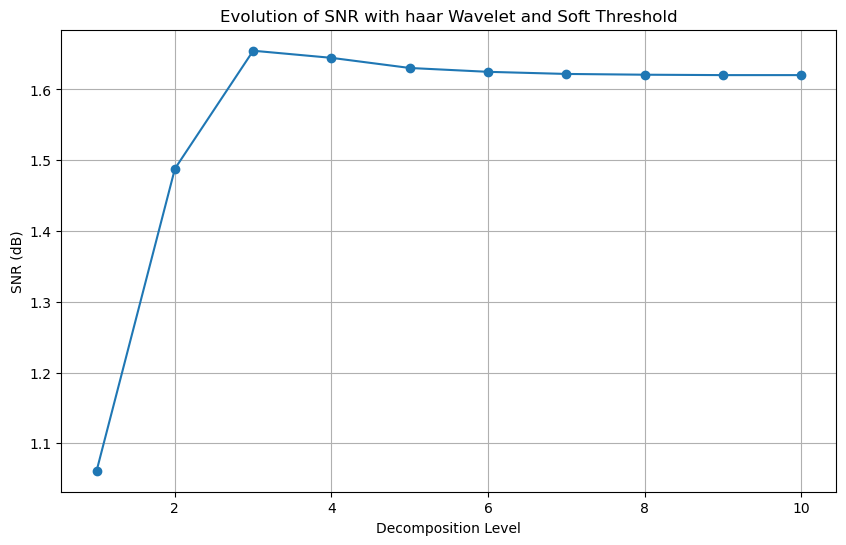

In [23]:
# function to plot the evolution of SNR between original and denoised image for an image with 'Haar' wavelet and 'soft' threshold
# for levels varying from 1 to 10
def plot_snr_evolution(img, snr, wavelet_type, threshold_type, max_level):
    levels = list(range(1, max_level + 1))
    snr_values = []
    
    noise = generate_noise(img, snr)
    noise_std = np.std(noise)
    
    noisy_img = add_noise(img, snr)
    noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)
    
    for level in levels:
        denoised_img = denoise_wavelet_adaptive(noisy_img, wavelet_type, level, threshold_type, noise_std)
        snr_value = calculate_snr(img, denoised_img)
        snr_values.append(snr_value)
    
    # Plot the SNR evolution
    plt.figure(figsize=(10, 6))
    plt.plot(levels, snr_values, marker='o', linestyle='-')
    plt.xlabel('Decomposition Level')
    plt.ylabel('SNR (dB)')
    plt.title(f'Evolution of SNR with {wavelet_type} Wavelet and {threshold_type.capitalize()} Threshold')
    plt.grid(True)
    plt.show()

plot_snr_evolution(img, snr, 'haar', 'soft', 10)


# Translation Invariant Wavelet Transform 

In [24]:
from scipy.ndimage import shift

# function to perform translation invariant wavelet denoising using cycle-spinning
def denoise_wavelet_translation_invariant(img, wavelet_type, level, threshold_type, noise_std, num_shifts=4):
    denoised_imgs = np.zeros((num_shifts, *img.shape))
    
    for i in range(num_shifts):
        shift_amount = (i, i)
        img_shifted = np.roll(img, shift_amount, axis=(0, 1))
        denoised_img_shifted = denoise_wavelet_adaptive(img_shifted, wavelet_type, level, threshold_type, noise_std)
        denoised_img = np.roll(denoised_img_shifted, (-shift_amount[0], -shift_amount[1]), axis=(0, 1))
        denoised_imgs[i] = denoised_img
    
    denoised_img_final = np.mean(denoised_imgs, axis=0)
    
    return np.clip(denoised_img_final, 0, 255).astype(np.uint8)

# function to generate a table of SNR values for different combinations and sort the table by SNR value
def generate_sorted_snr_table_ti(img, snr, wavelet_types, levels, threshold_types, num_shifts=4):
    table_data = []
    
    noise = generate_noise(img, snr)
    noise_std = np.std(noise)
    
    noisy_img = add_noise(img, snr)
    noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)
    
    for wavelet_type in wavelet_types:
        for level in levels:
            for threshold_type in threshold_types:
                denoised_img = denoise_wavelet_translation_invariant(noisy_img, wavelet_type, level, threshold_type, noise_std, num_shifts)
                snr_value = calculate_snr(img, denoised_img)
                row = [wavelet_type, level, threshold_type, round(snr_value, 2)]
                table_data.append(row)
                
    table_data.sort(key=lambda x: x[3], reverse=True)
    
    headers = ['Wavelet Type', 'Number of Levels', 'Threshold Type', 'SNR (dB)']
    print("{:<15} {:<20} {:<15} {:<10}".format(*headers))
    print("="*60)
    
    for row in table_data:
        print("{:<15} {:<20} {:<15} {:<10}".format(*row))


Wavelet Type    Number of Levels     Threshold Type  SNR (dB)  
haar            3                    soft            1.86      
db1             3                    soft            1.86      
haar            5                    soft            1.81      
db1             5                    soft            1.81      
haar            7                    soft            1.79      
db1             7                    soft            1.79      
haar            3                    hard            0.68      
haar            5                    hard            0.68      
haar            7                    hard            0.68      
db1             3                    hard            0.68      
db1             5                    hard            0.68      
db1             7                    hard            0.68      


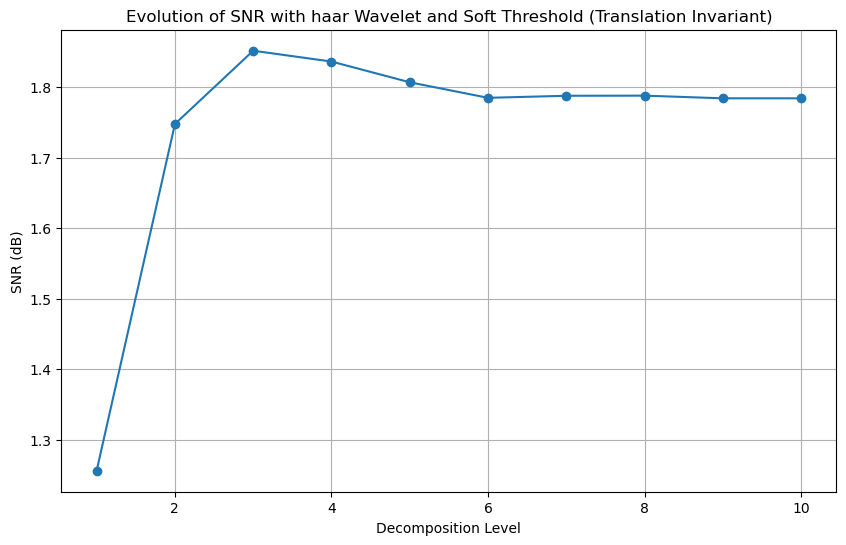

In [25]:
# function to plot the evolution of SNR for translation-invariant wavelet denoising
def plot_snr_evolution_ti(img, snr, wavelet_type, threshold_type, max_level, num_shifts=4):
    levels = list(range(1, max_level + 1))
    snr_values = []
    
    noise = generate_noise(img, snr)
    noise_std = np.std(noise)
    
    noisy_img = add_noise(img, snr)
    noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)
    
    for level in levels:
        denoised_img = denoise_wavelet_translation_invariant(noisy_img, wavelet_type, level, threshold_type, noise_std, num_shifts)
        snr_value = calculate_snr(img, denoised_img)
        snr_values.append(snr_value)
    
    plt.figure(figsize=(10, 6))
    plt.plot(levels, snr_values, marker='o', linestyle='-')
    plt.xlabel('Decomposition Level')
    plt.ylabel('SNR (dB)')
    plt.title(f'Evolution of SNR with {wavelet_type} Wavelet and {threshold_type.capitalize()} Threshold (Translation Invariant)')
    plt.grid(True)
    plt.show()

generate_sorted_snr_table_ti(img, snr, new_wavelet_types, new_levels, threshold_types, num_shifts=4)

plot_snr_evolution_ti(img, snr, 'haar', 'soft', 10, num_shifts=4)
